In [1]:
# Khare, Ankit
# 1001-367-474
# 2017-04-15
# Assignment_04_01

# Task1: 
-Load all the 25 face images in the  ""Eigenfaces\Train".

-Display all the original faces in an 5 by 5 grid. Resize the images to 100 by 100 for display only.

-Find the mean face image. Perform PCA on the training faces.

-Display the mean face. Resize the mean face to 100 by 100 for display only.

-Display all the eigenfaces in an 5 by 5 grid.

In [2]:
# Program typically takes 20-30 seconds to finish executing. Please select "restart and runall" option in case there's a problem
# in running the program again.
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from PIL import Image
import glob
import matplotlib.gridspec as gridspec
import os
import cv2
import scipy.misc as sci
from numpy.linalg import eigh, svd
import operator
import numpy.linalg as eim
from numpy import max, zeros, average, dot, sort, trace

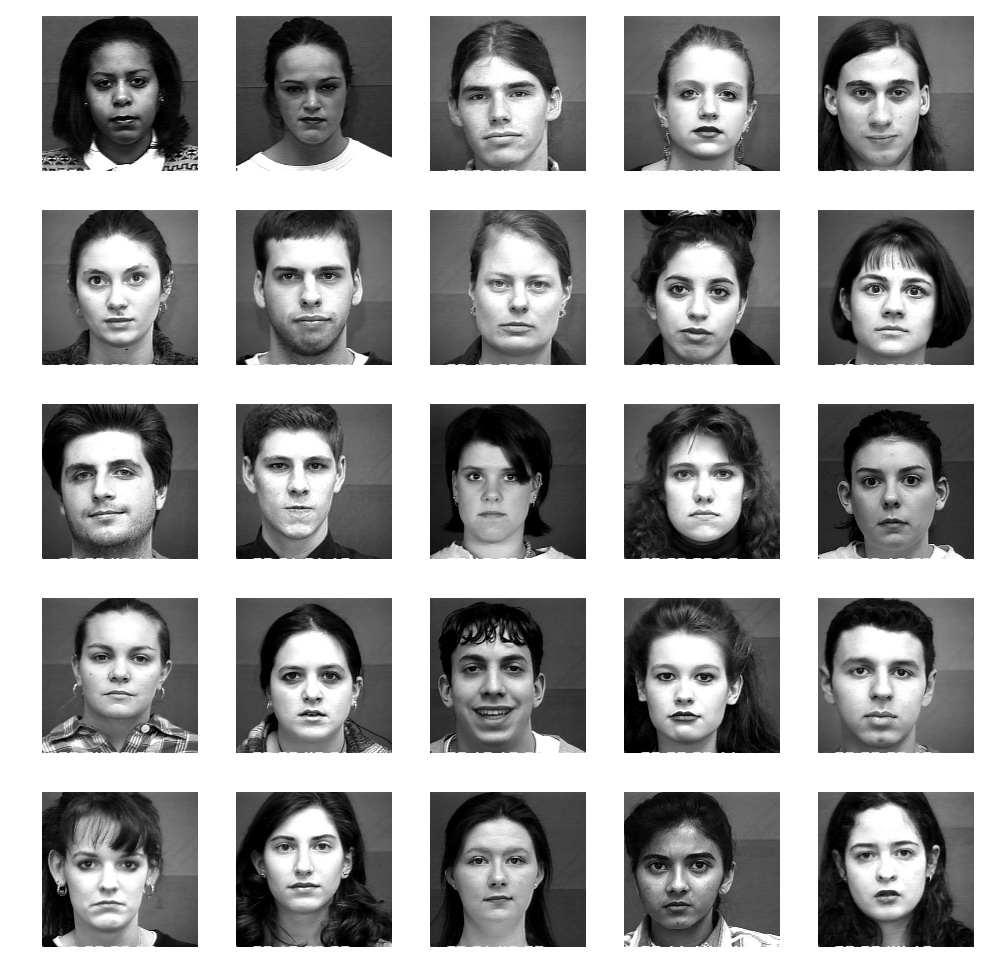

In [3]:
cwd = os.getcwd()
root = "/Eigenfaces/"
train_folder = root + "Train"
test_folder = root + "Test"
os.chdir( cwd + '/Eigenfaces/Train')
files = os.listdir(cwd + '/Eigenfaces/Train')
images = [Image.open(f).convert('LA') for f in files]
fig = plt.figure()

# grid = ImageGrid(fig, 111, # similar to subplot(111)
#                 nrows_ncols = (5, 5),
#                 axes_pad=0.1, # pad between axes in inch.
#                 )

    
def form_grid(img_list):
    num_rows = 5
    num_cols = 5
    fig = plt.figure(figsize=(10,10))
    gs = gridspec.GridSpec(num_rows, num_cols, wspace=0.0)
    ax = [plt.subplot(gs[i]) for i in range(num_rows*num_cols)]
    gs.update(hspace=0)
    gs.tight_layout(fig, h_pad=0,w_pad=0)

    for i,im in enumerate(img_list):
        ax[i].imshow(im, cmap = plt.get_cmap("gray"))
        ax[i].axis('off')

    plt.show()
    
form_grid(images)
image_size = 425
#theshold settings
th = {'2':200,'5':2000,'15':4400}

In [4]:
def prepare_eigen_matrix(Eigen_faces,size):
    eigen_face_array = []
    size_tmp = np.shape(Eigen_faces)[1]
    for i in range(size_tmp):
        face = Eigen_faces[:,i]
        eigen_face = np.transpose(np.reshape(face, (size, -1), order='F'))
        eigen_face_array.append(eigen_face)
    return eigen_face_array

def create_dictionary_Eigen(Eigen_vectors, Eigen_values):
    dictionary = []
    size = np.shape(Eigen_values)[0]
    for i in range(size):
        dict = {}
        vector = Eigen_vectors[i]
        value = Eigen_values[i]
        dict['EValue'] = value
        dict['EVector'] = vector
        dictionary.append(dict)
    return dictionary

def get_images(train_folder):
    original_img = []
    os.chdir(cwd + train_folder)
#     print(os.getcwd())
    img_100 = []
#     chdir(cwd + train_folder)
#     print(cwd + train_folder)
    all_image_names = os.listdir(cwd + train_folder)
    names = []
    for image_name in all_image_names:
        if image_name.split(".")[1]=="db":
            continue

        name = image_name.split("_")[0]

        gray_image = cv2.imread(image_name, 0)
        image_r = sci.imresize(gray_image.copy(), (100,100))
        image_int_array = np.asarray(gray_image)
        image_int_array = image_int_array/255

        original_img.append(image_int_array)
        img_100.append(image_r)
        names.append(name)
    return original_img,img_100,names

def transpose_image_matrix(original_image):
    n,w,h = np.shape(original_image)
    image_matrix = []
    for i in range(n):
        image = original_image[i]
        r,c = np.shape(image)
        image_matrix.append(np.transpose(np.reshape(image,r*c)))
    return np.transpose(image_matrix)

original_images,image_100,training_names = get_images(train_folder)
image_matrix = transpose_image_matrix(original_images)

no_training_imgs = np.shape(original_images)[0]
mean_vector = np.mean(image_matrix, axis=1)
zero_mean_image_matrix = np.transpose(np.transpose(image_matrix)-np.transpose(mean_vector))
mean_image = np.transpose(np.reshape(mean_vector,(image_size,-1),order='F'))
covariance_matrix = np.cov(zero_mean_image_matrix, rowvar=False)
Eigen_values, Eigen_vectors = eim.eig(covariance_matrix)
for i in range(25):
    vec = Eigen_vectors[i]
    norm_val = np.sqrt(np.sum(np.square(vec)))
    vec = vec/norm_val
    Eigen_vectors[i] = vec
Eigen_faces = np.dot(zero_mean_image_matrix,Eigen_vectors)
Eigen_faces = prepare_eigen_matrix(Eigen_faces,image_size)

In [5]:
def display_test_images(threshold, testing_images,resize):
    size = len(testing_images)
    for i in range(size):
        k = testing_images[i]['k']
        all_images = testing_images[i]['test_dict']
        size_tmp = len(all_images)    
        thr = threshold[str(k)]
        for j in range(size_tmp):
            images = all_images[j]
            train_img = images['train_image']
            test_img = images['test_img']
            min_dist = images['distance']
            print('Recognizing for K = ', k)
            print("Euclidean Distance : ",min_dist)
            
            if min_dist<=thr:
                fig, axes_array = plt.subplots(1, 2)
                image_ts = sci.imresize(test_img.copy(), (100, 100))
                image_plot = axes_array[0].imshow(image_ts, cmap=plt.cm.gray)
                axes_array[0].axis('off')
            
                image_tr = sci.imresize(train_img.copy(), (100, 100))
                image_plot = axes_array[1].imshow(image_tr, cmap=plt.cm.gray)
                axes_array[1].axis('off')
                plt.show()
            else:
                image_ts = sci.imresize(test_img.copy(), (100, 100))
                plt.imshow(image_ts, cmap=plt.cm.gray)
                plt.axis('off')
                plt.show()
            
original_images,image_100,training_names = get_images(train_folder)
no_training_imgs = np.shape(original_images)[0]
image_matrix = transpose_image_matrix(original_images)
mean_vector = np.mean(image_matrix, axis=1)

(25, 180625)
(180625,)
Mean Face


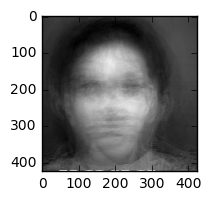

In [6]:
# chdir( cwd + '/Eigenfaces/Train')
# get original dimensions
os.chdir(cwd + train_folder)
# jpgs = glob.glob('\\Eigenfaces\\Train' + '/*.jpg')

jpgs = os.listdir( cwd + train_folder)
# load a greyscale version of each image
imgs = np.array([sci.imread(i, True).flatten() for i in jpgs])
print(imgs.shape)
for i in range(len(jpgs)):
    ui = imgs[i]
    ui.shape = (425, 425)
    imgs[i] = imgs[i] / trace(dot(ui.transpose(), ui))
#     lst_imgs.insert(i, np.reshape(imgs[i], (425, 425)))
mu = np.mean(imgs, 0)
print(mu.shape)
img_dims = (425, 425)
os.chdir(cwd )
sci.imsave("mean.jpg", mu.reshape(img_dims))
my_image=Image.open('mean.jpg') # read the image
mean_img= np.asarray(my_image) # Convert the image to numpy array
plt.figure(figsize=(2,2))
print("Mean Face")
image_plot = plt.imshow(mean_img, cmap = plt.get_cmap("gray"))
os.chdir(cwd)
# from scipy import linalg
# sci.imsave("/mean.jpg", mu.reshape(img_dims))
# images = [Image.open(f).convert('L') for f in files]
# imgs = np.array([sci.imread(i, True).flatten() for i in images])
# H,W = np.shape(images[0])
# print ('shape=', H, W)

# im_number = len(images)
# fill array with rows as image
# and columns as pixels
# arr = np.zeros([im_number,H*W])

# for i in range(im_number):
#     im = Image.open(images[i]).convert("L")
#     arr[i,:] = np.reshape(np.asarray(im),[1,H*W])

# mean_image = np.mean(imgs, 0)
# sci.imsave(cwd + "/mean.jpg", mean_image.reshape(H,W))
# mu.reshape(img_dims)
# plt.imshow(mu, cmap = plt.get_cmap("gray"))
# plt.figure()
# X_data = []
# files = glob.glob ("*.jpg")
# imgs = np.array([sci.imread(i, True).flatten() for i in files])

# mean_image = np.mean(imgs, 0)
# plt.figure(figsize=(2,2))
# image_plot = plt.imshow(mean_image, cmap = plt.get_cmap("gray"))
# chdir('C:/Users/AK/Documents/UTA/Spring17 Courses/Computer Vision/Assignments/Khare_04')


imgs shape: mean shape (25, 180625) (180625,)
(25, 180625)


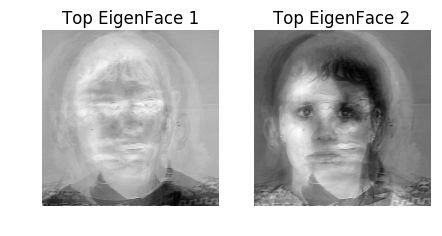

In [7]:
ma_data = imgs - mu.transpose()
print("imgs shape: mean shape", imgs.shape, mu.shape)
adjfaces_transpose = ma_data.transpose()
L = dot(ma_data, adjfaces_transpose)
evals1, evects1 = eigh(L)
    # else:
    #     evects1, evals1, vt = svd(L, 0)
reversed_evalue_order = evals1.argsort()[::-1]
evects = evects1[:,reversed_evalue_order]
evals = sort(evals1)[::-1]
eigen_space = dot(adjfaces_transpose, evects).transpose()
print(eigen_space.shape)
lst_imgs = []
for i in range(len(imgs)):
    ui = eigen_space[i]
    ui.shape = (425, 425)
    eigen_space[i] = eigen_space[i] / trace(dot(ui.transpose(), ui))
    lst_imgs.insert(i, np.reshape(eigen_space[i], (425, 425)))
    
# im1 = np.reshape(eigen_space[0], (425, 425))
# plt.figure(figsize=(2,2))
# image_plot = plt.imshow(im1, cmap = plt.get_cmap("gray"))

fig1, axes_array = plt.subplots(1, 2)
fig1.set_size_inches(5,5)
    
image_plot = axes_array[0].imshow(lst_imgs[0] ,cmap=plt.cm.gray)
axes_array[0].axis('off')
axes_array[0].set(title='Top EigenFace 1')
    
image_plot = axes_array[1].imshow(lst_imgs[1] ,cmap=plt.cm.gray)
axes_array[1].axis('off')
axes_array[1].set(title='Top EigenFace 2')
    
plt.show()
    

In [8]:
def reconstruct_img(no_evectors,zero_mean_image_matrix,eigen_vector_dict,mean_vector):
    dictionary_ev = []
    for k in no_evectors:
        dict = {}
        dict['k'] = k
#         print("k is: ", k)
        ev_selected = []
        count = 0
        topmost_ev = eigen_vector_dict[0:k]
        for i in range(k):
            dict_evec = topmost_ev[i]
            eigen_vec = dict_evec['EVector']
            ev_selected.append(eigen_vec)
#             print("i is: ", i)    
        ev_selected = np.transpose(ev_selected)
        eigen_faces = np.dot(zero_mean_image_matrix, ev_selected).transpose()
#         print("ef space: ", eigen_faces.shape)
        dict['eigen_faces'] = eigen_faces
        weightf = np.dot(eigen_faces, zero_mean_image_matrix).transpose()
#         print("wegt space: ", weightf.shape)
        dict['weightf'] = weightf

        reconstructed_image = np.dot(weightf, eigen_faces)
        reconstructed_image = reconstructed_image/np.max(reconstructed_image)
        reconstructed_image = reconstructed_image + np.transpose(mean_vector)
        reconstructed_image = np.transpose(reconstructed_image)

        reconstruct_images = prepare_eigen_matrix(reconstructed_image, image_size)
        dictionary_ev.append(dict)

    return dictionary_ev

Eigen Faces in descending order


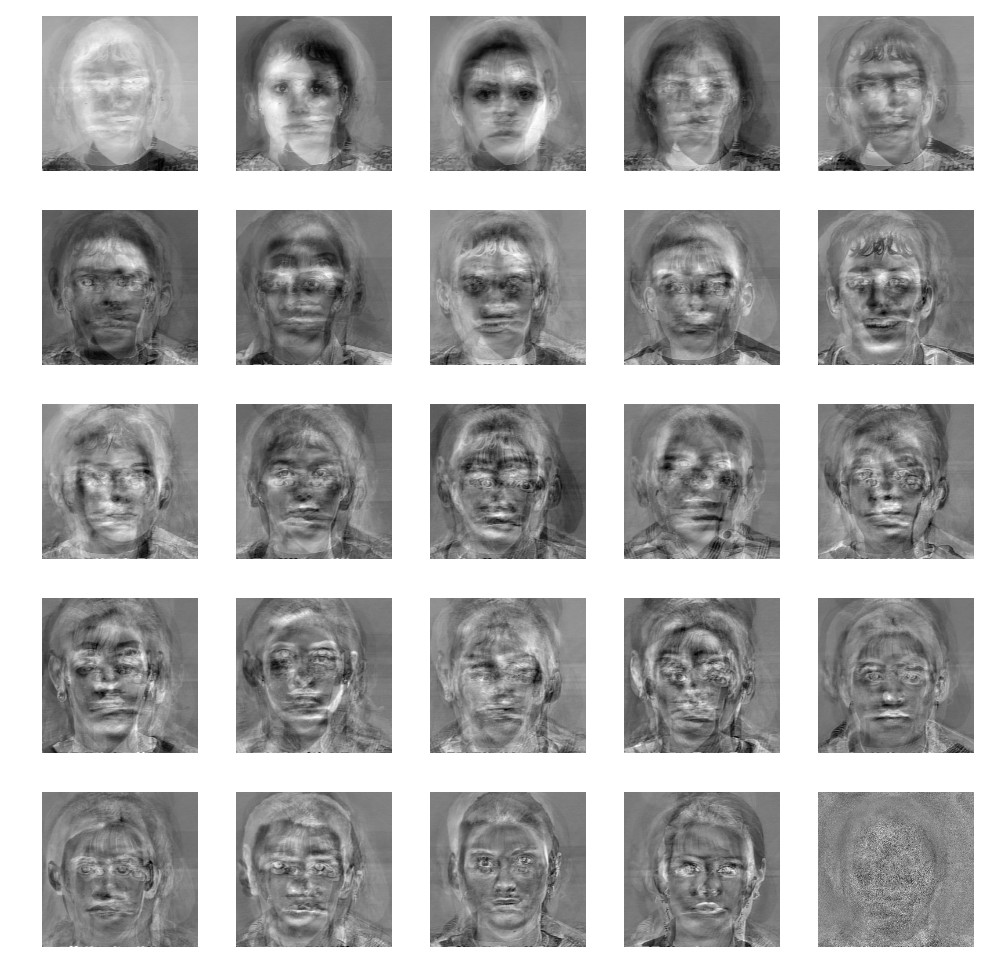

In [9]:
print("Eigen Faces in descending order")
form_grid(lst_imgs)


In [10]:
def recons_k_show(k):
    weights = np.dot(ma_data, eigen_space[0:k,:].transpose())
    print("m ei", ma_data.shape, eigen_space.shape)
    recon = mu.transpose() + np.dot(weights, eigen_space[0:k,:])
    # print("mu.trans", np.dot(weights, eigen_space[0:1]).shape)
    print("re: ", mu.shape)
# constructed_ig = np.reshape(recon[1,:], (425, 425))
# plt.figure(figsize=(2,2))
# image_plot = plt.imshow(constructed_ig, cmap = plt.get_cmap("gray"))
    lst_recon = []
    for i in range(len(imgs)):
#     ui = recon[i]
#     ui.shape = (425, 425)
#     recon[i] = recon[i] / trace(dot(ui.transpose(), ui))
        lst_recon.insert(i, np.reshape(recon[i], (425, 425)))
    form_grid(lst_recon)    
    

Reconstructed faces k=2
m ei (25, 180625) (25, 180625)
re:  (180625,)


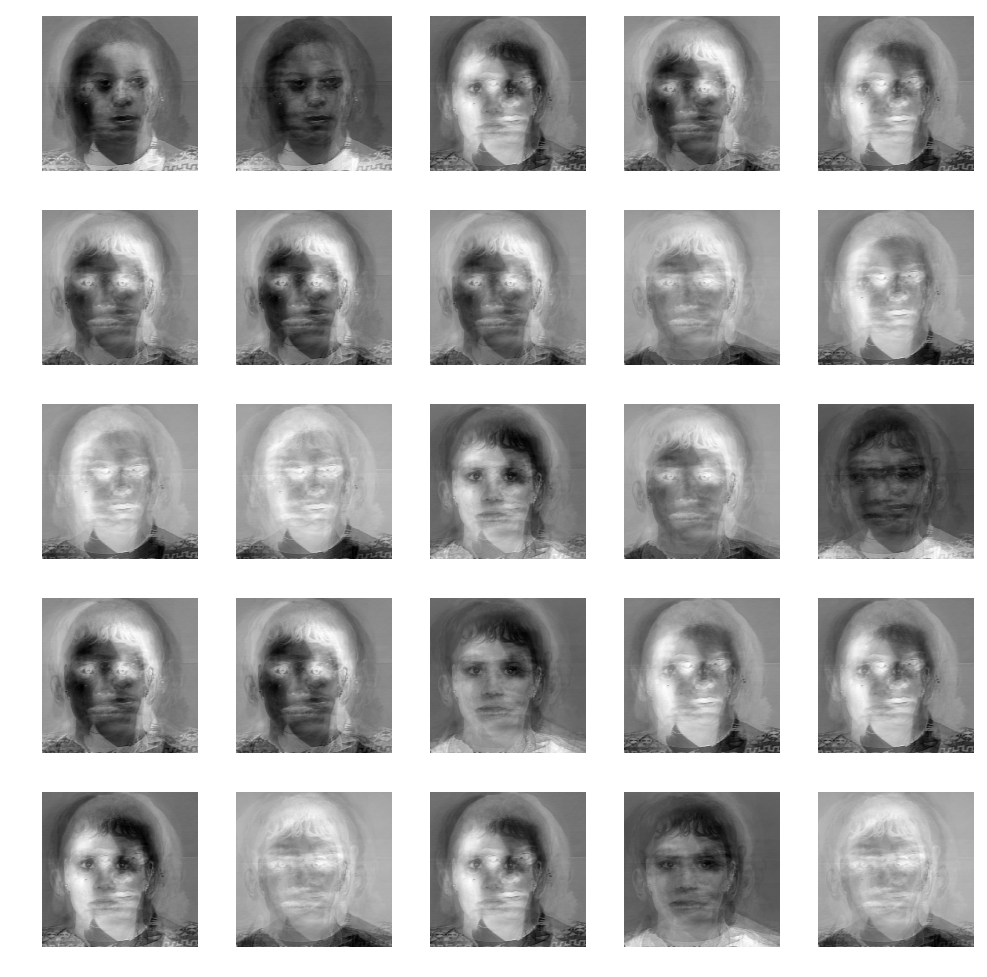

In [11]:
print("Reconstructed faces k=2")
recons_k_show(2)


Reconstructed faces k=5
m ei (25, 180625) (25, 180625)
re:  (180625,)


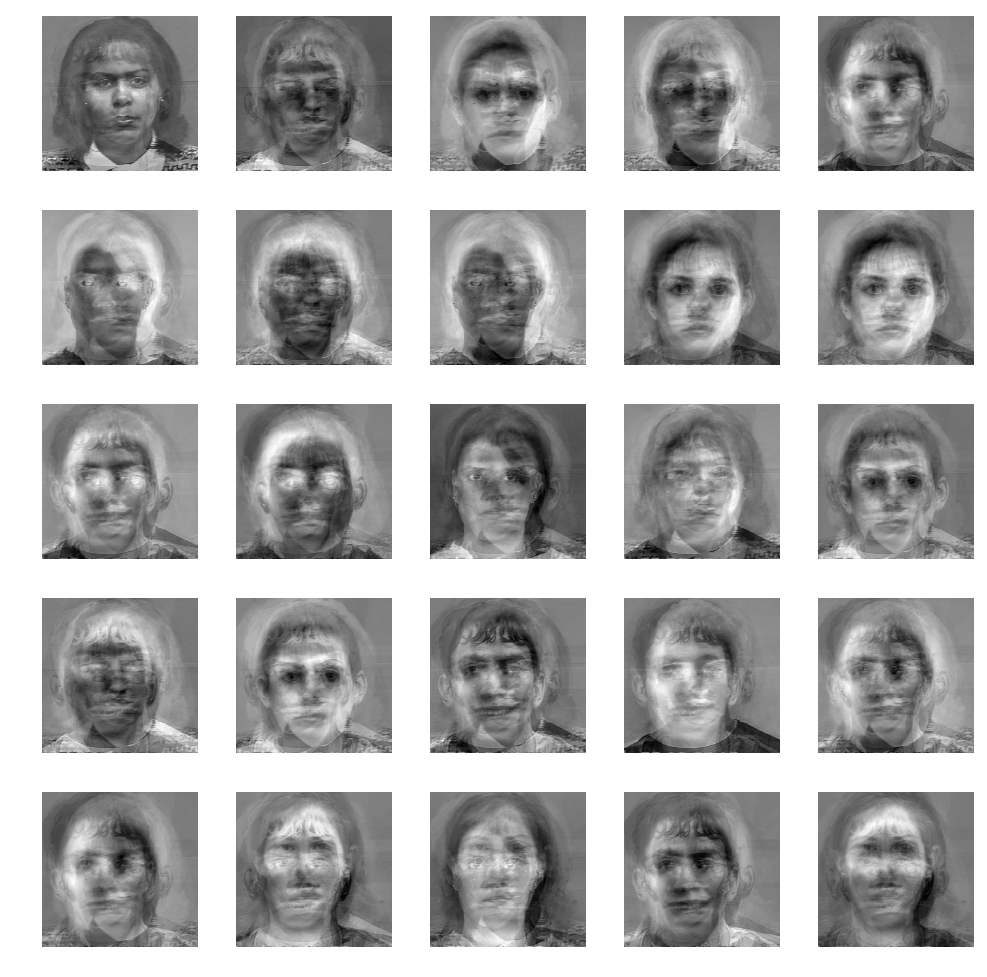

In [12]:
print("Reconstructed faces k=5")
recons_k_show(5)


Reconstructed faces k=15
m ei (25, 180625) (25, 180625)
re:  (180625,)


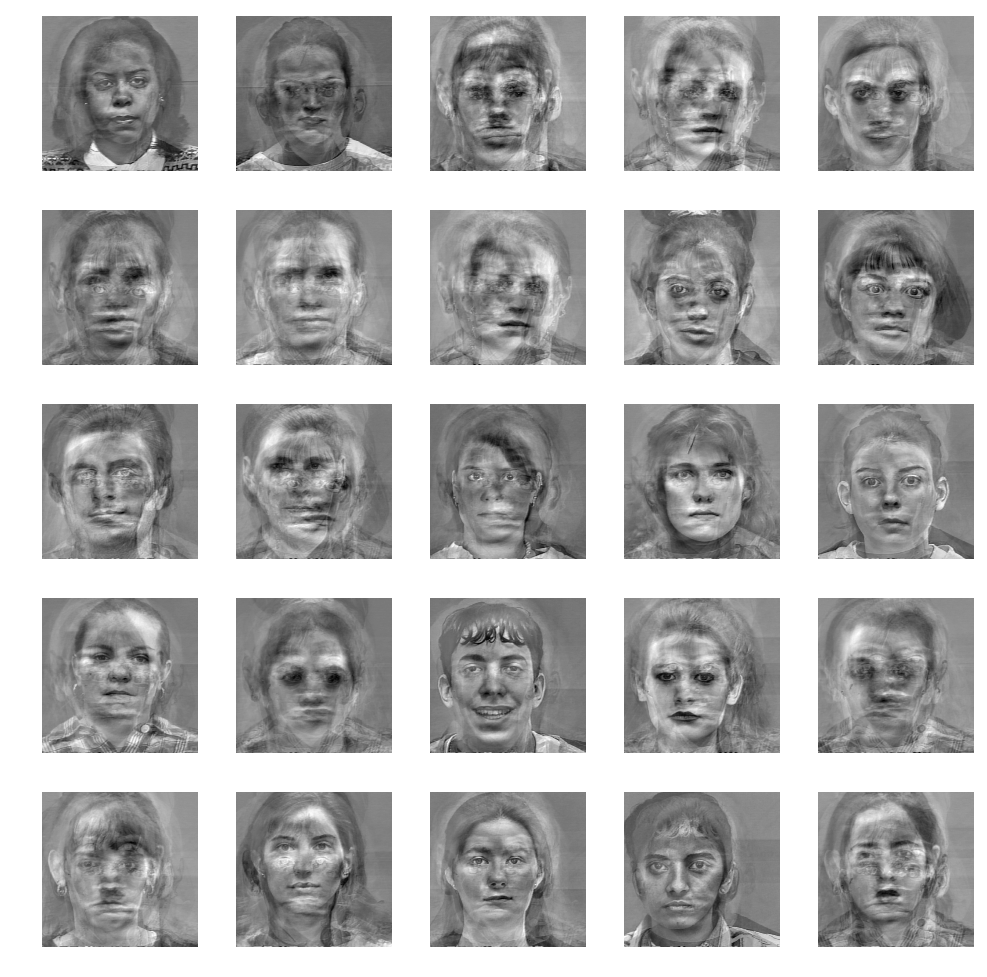

In [13]:
print("Reconstructed faces k=15")
recons_k_show(15)

Reconstructed faces with all eigenvectors
m ei (25, 180625) (25, 180625)
re:  (180625,)


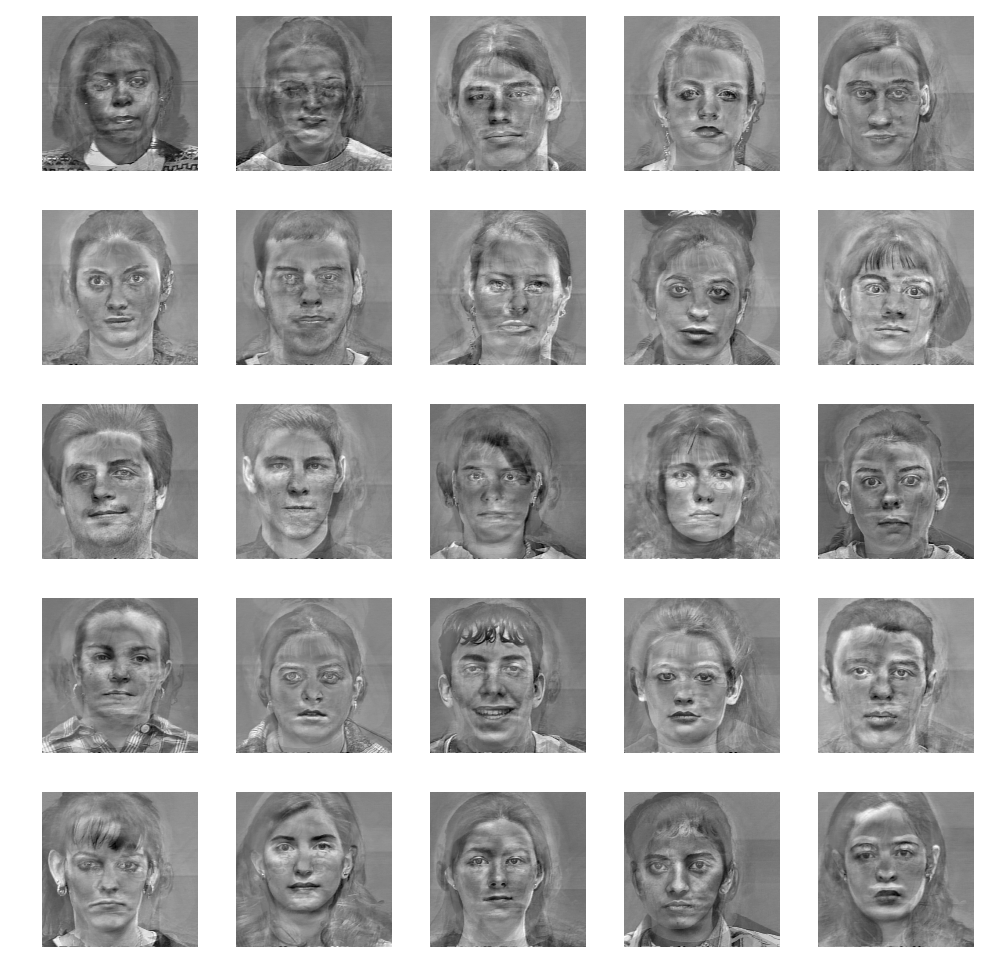

In [14]:
print("Reconstructed faces with all eigenvectors")
recons_k_show(24)

In [15]:
def match_images(zero_mean_matrix, dictionary_ev, image_100, test_image_100, testing_names, training_names):
    sum_test_images = []
    large_int = 555555555555555
    initial_dist = 55555555
    for dict in dictionary_ev:
        k = dict['k']
        eigen_faces = dict['eigen_faces']
        weightf = dict['weightf']
        weightf_test = np.dot(eigen_faces, zero_mean_matrix) 
        weightf_test = np.transpose(weightf_test)
        size_test_wtf = np.shape(weightf_test)[0]
        size_train_wt = np.shape(weightf)[0]
        test_dict = []
        th_value = large_int
        for i in range(size_test_wtf):
            dict = {}
            position = -1
            count = 0
            wt_f = weightf_test[i]
            min_dist = initial_dist
            for j in range(size_train_wt):
                wt_temp = weightf[j]
                diff_vec = (wt_temp - wt_f)
                e = np.square(diff_vec)
                f = np.sum(e)
                value = np.sqrt(f)
                if count == 0:
                    position = j
                    min_dist = value
                    count = count + 1
                else:
                    if value < min_dist:
                        position = j
                        min_dist = value
                        th = value
            if th_value > min_dist:
                th_value = min_dist
            train_img = image_100[position]
            test_img = test_image_100[i]
            train_img_name = training_names[position]
            test_img_name = testing_names[i]
            dict['train_image'] = train_img
            dict['test_img'] = test_img
            dict['train_img_name'] = train_img_name
            dict['test_img_name'] = test_img_name
            dict['distance'] = min_dist
            test_dict.append(dict)
        k_dict = {}
        k_dict['test_dict'] = test_dict
        k_dict['th'] = th_value
        k_dict['k'] = k
        sum_test_images.append(k_dict)
        
    return sum_test_images

In [16]:
def mean_matrix(mean_vector, image_matrix):
    zero_mean = np.transpose(np.transpose(image_matrix) - np.transpose(mean_vector))
    print("know shape: ", zero_mean.shape)
    return zero_mean

In [17]:
original_images,image_100,training_names = get_images(train_folder)
no_training_imgs = np.shape(original_images)[0]
image_matrix = transpose_image_matrix(original_images)

In [18]:
def find_error_rate(sum_test_imgs):
    x_coor = []
    y_coor = []
    error_dictionary = []
    for dict_k in sum_test_imgs:
        error_dict = {}
        th_value = dict_k['th']
        count = 0
        count2 = 0
        k = dict_k['k']
        testing_dt = dict_k['test_dict']
        for dict in testing_dt:
            train_img_name = dict['train_img_name']
            test_img_name = dict['test_img_name']
            count2 = count2 + 1
            if train_img_name != test_img_name:
                count = count + 1
        error = count / count2
        error_dict['error'] = error
        error_dictionary.append(error_dict)
        error_dict['k'] = k
        x_coor.append(k)
        y_coor.append(error)

    return error_dictionary, x_coor, y_coor

In [19]:
def plot_graph_of_error(x,y):
    plt.plot(x, y, marker='x', linestyle='-', color='r', label='q')
    plt.xlabel('Error Rate')
    plt.ylabel('K Value')
    plt.title('Error rate with respect to k value')
    plt.show()

# Task 3

In [20]:
test_images,test_image_100,testing_names = get_images(test_folder)
number_of_testing_images = np.shape(test_images)[0]
test_image_matrix = transpose_image_matrix(test_images)
zero_mean_matrix = mean_matrix(mean_vector, test_image_matrix)

know shape:  (180625, 32)


mathing for K=2
Recognizing for K =  2
Euclidean Distance :  546.276505482


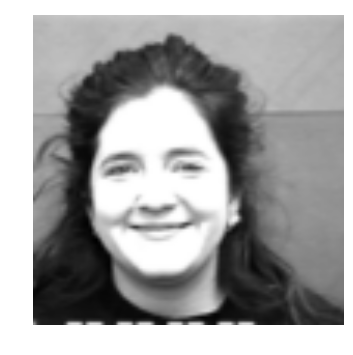

Recognizing for K =  2
Euclidean Distance :  821.006909679


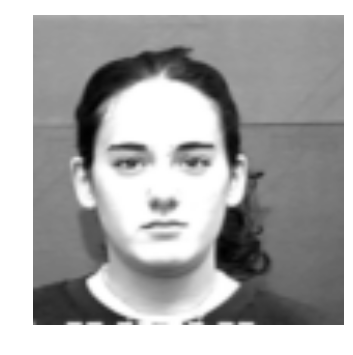

Recognizing for K =  2
Euclidean Distance :  240.7204872


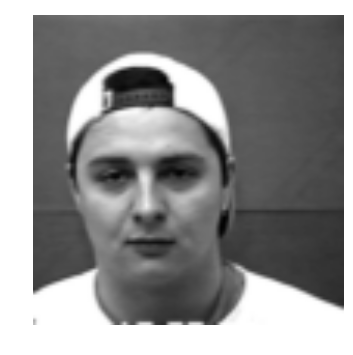

Recognizing for K =  2
Euclidean Distance :  205.301246501


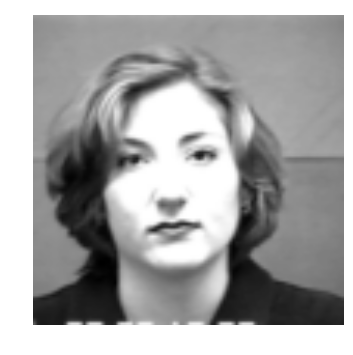

Recognizing for K =  2
Euclidean Distance :  834.766625912


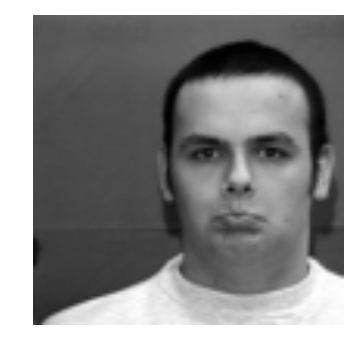

Recognizing for K =  2
Euclidean Distance :  1018.73942497


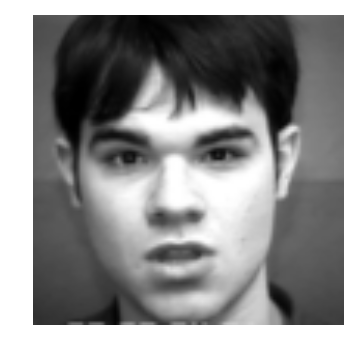

Recognizing for K =  2
Euclidean Distance :  72.9276599419


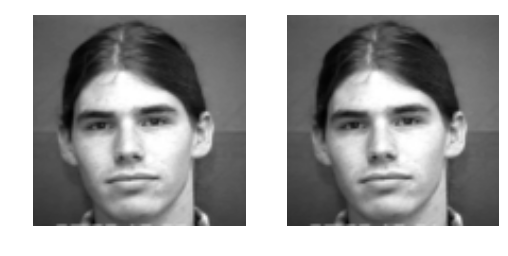

Recognizing for K =  2
Euclidean Distance :  282.325826353


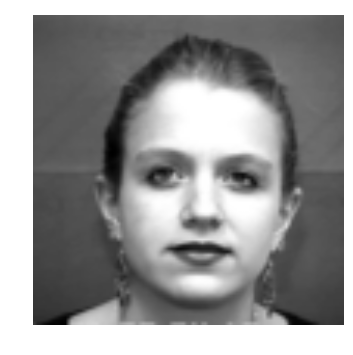

Recognizing for K =  2
Euclidean Distance :  15.0303887981


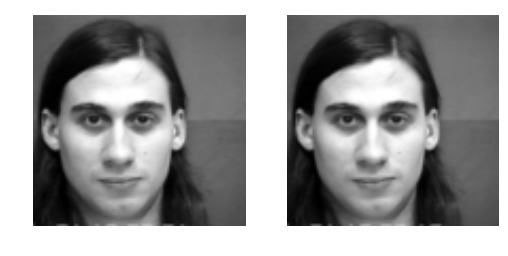

Recognizing for K =  2
Euclidean Distance :  652.713403051


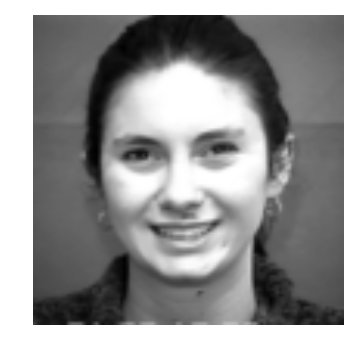

Recognizing for K =  2
Euclidean Distance :  321.537417869


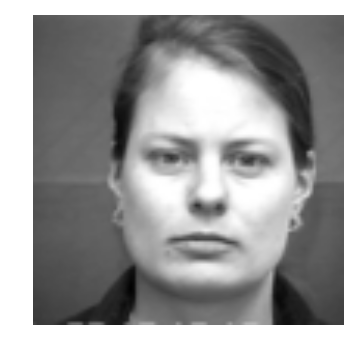

Recognizing for K =  2
Euclidean Distance :  440.239444933


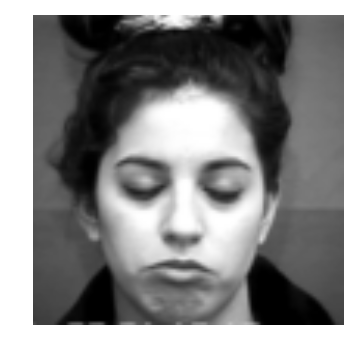

Recognizing for K =  2
Euclidean Distance :  266.320223537


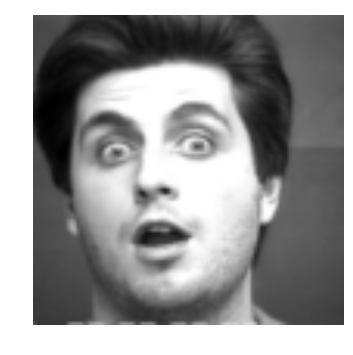

Recognizing for K =  2
Euclidean Distance :  358.251023459


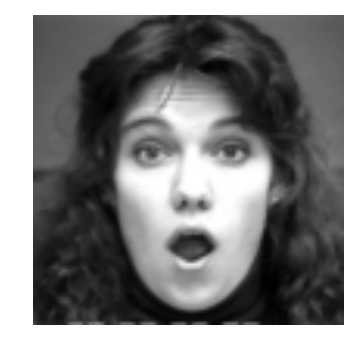

Recognizing for K =  2
Euclidean Distance :  139.642474781


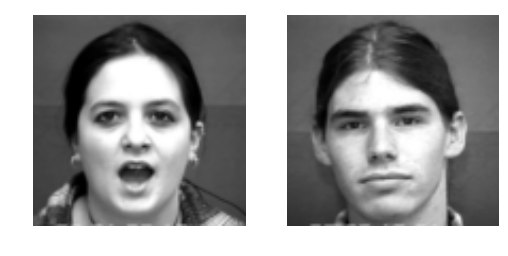

Recognizing for K =  2
Euclidean Distance :  185.621404689


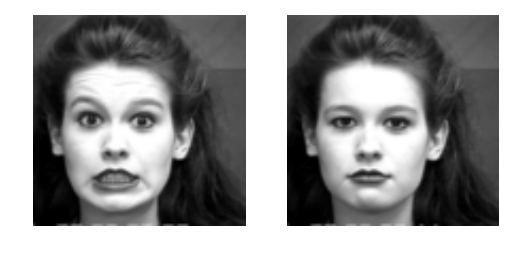

Recognizing for K =  2
Euclidean Distance :  217.308785123


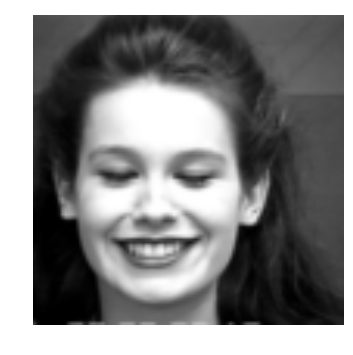

Recognizing for K =  2
Euclidean Distance :  685.425248035


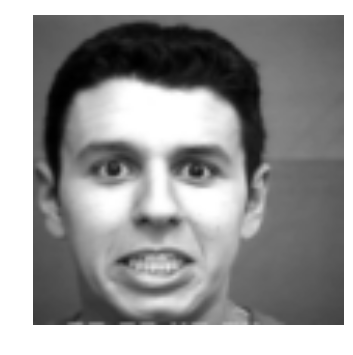

Recognizing for K =  2
Euclidean Distance :  387.282595376


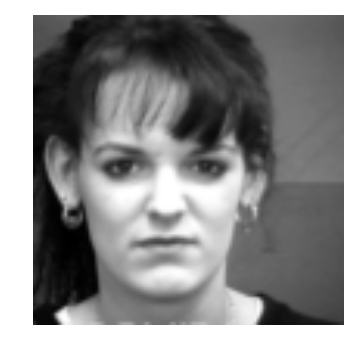

Recognizing for K =  2
Euclidean Distance :  302.85742251


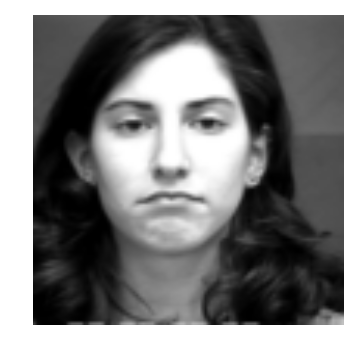

Recognizing for K =  2
Euclidean Distance :  391.431831394


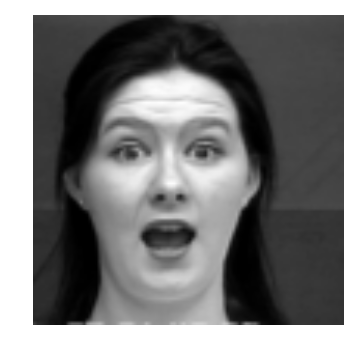

Recognizing for K =  2
Euclidean Distance :  205.895099666


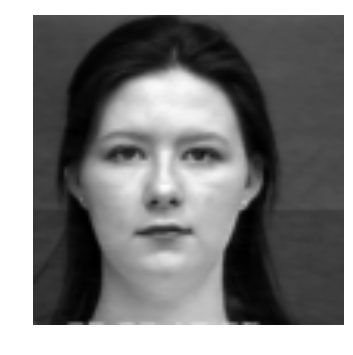

Recognizing for K =  2
Euclidean Distance :  940.549867215


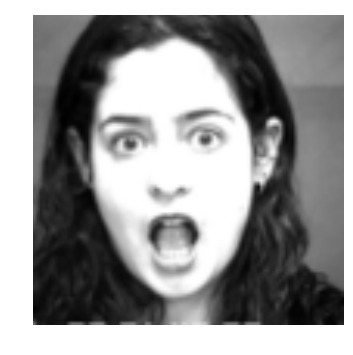

Recognizing for K =  2
Euclidean Distance :  887.680561302


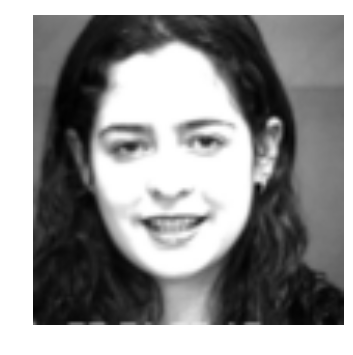

Recognizing for K =  2
Euclidean Distance :  1363.632517


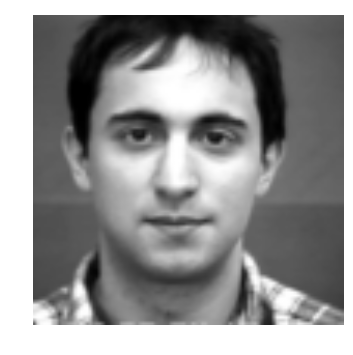

Recognizing for K =  2
Euclidean Distance :  619.684196717


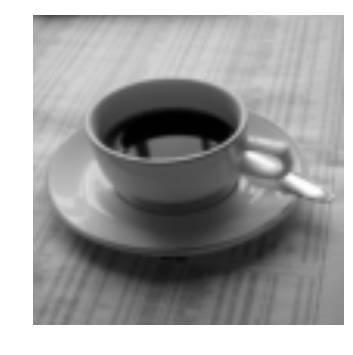

Recognizing for K =  2
Euclidean Distance :  1255.93790207


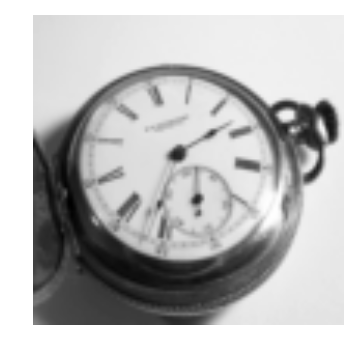

Recognizing for K =  2
Euclidean Distance :  535.451090385


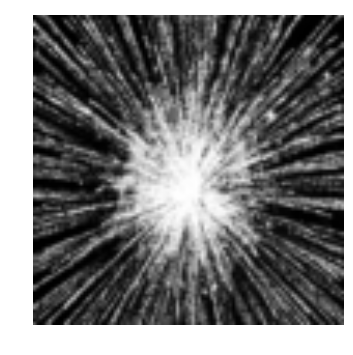

Recognizing for K =  2
Euclidean Distance :  219.285169839


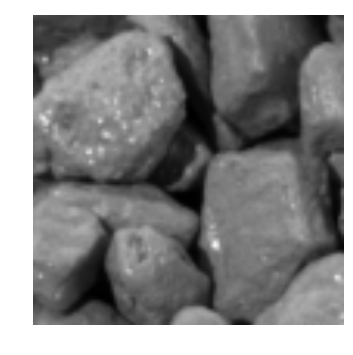

Recognizing for K =  2
Euclidean Distance :  828.299792824


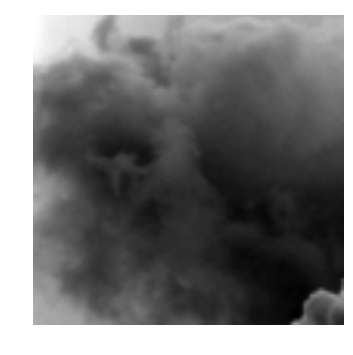

Recognizing for K =  2
Euclidean Distance :  263.579265516


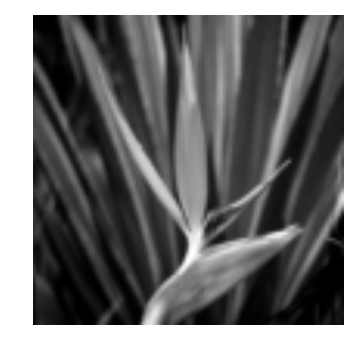

Recognizing for K =  2
Euclidean Distance :  1020.91545939


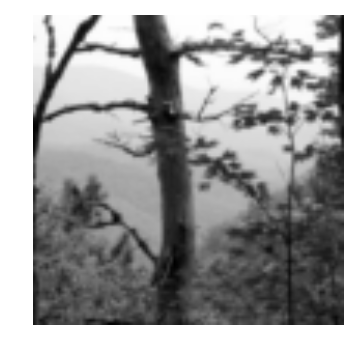

In [21]:
eigen_vector_dict = create_dictionary_Eigen(Eigen_vectors, Eigen_values)
eigen_vector_dict.sort(key=operator.itemgetter('EValue'), reverse=True)
no_evectors = [2]
dictionary_ev = reconstruct_img(no_evectors, zero_mean_image_matrix, 
                                  eigen_vector_dict,mean_vector)
sum_test_imgs = match_images(zero_mean_matrix, dictionary_ev,
                                                               image_100,
                                                               test_image_100,
                                                               testing_names,
                                                               training_names)
print('mathing for K=2')
display_test_images(th, sum_test_imgs,False)

mathing for K=5
Recognizing for K =  5
Euclidean Distance :  1577.01347763


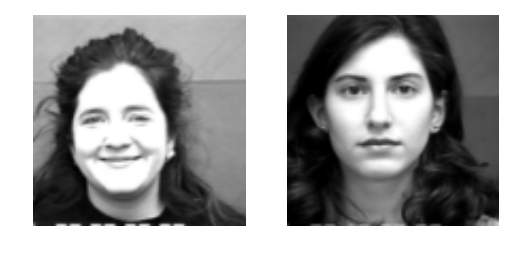

Recognizing for K =  5
Euclidean Distance :  1821.57009521


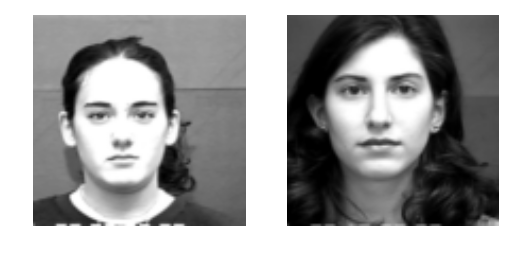

Recognizing for K =  5
Euclidean Distance :  2678.48971223


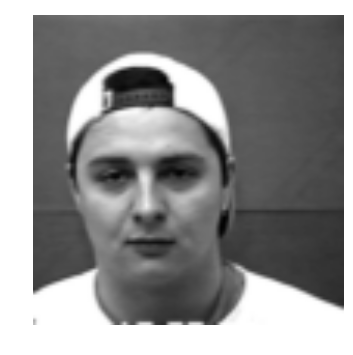

Recognizing for K =  5
Euclidean Distance :  2374.10044023


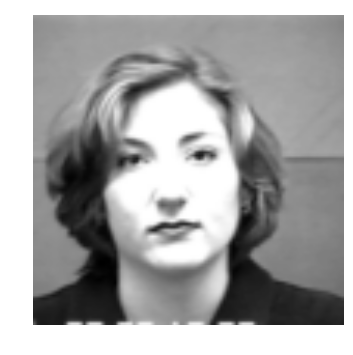

Recognizing for K =  5
Euclidean Distance :  2375.53503268


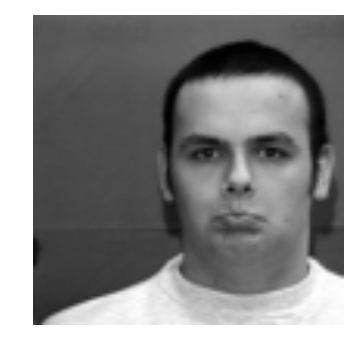

Recognizing for K =  5
Euclidean Distance :  1389.97236699


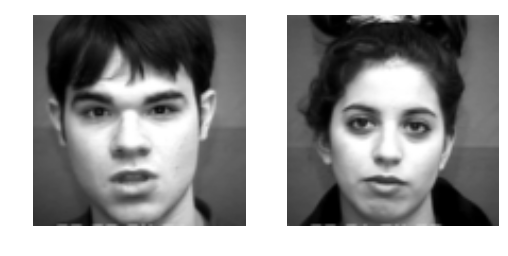

Recognizing for K =  5
Euclidean Distance :  93.471583124


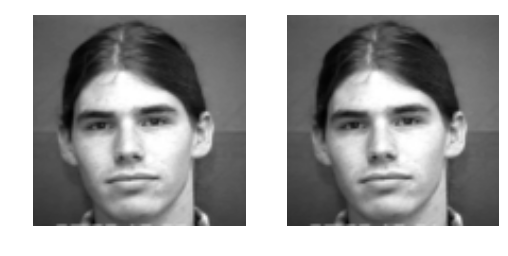

Recognizing for K =  5
Euclidean Distance :  597.978609067


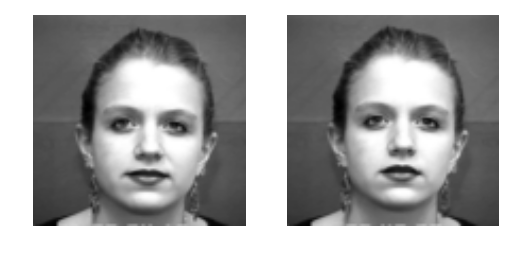

Recognizing for K =  5
Euclidean Distance :  36.6279585871


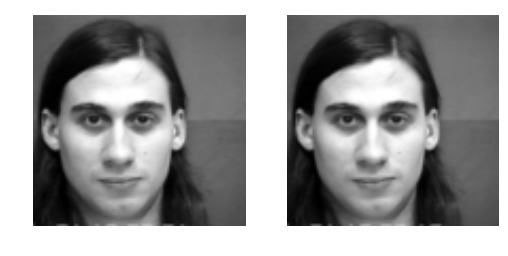

Recognizing for K =  5
Euclidean Distance :  692.253809062


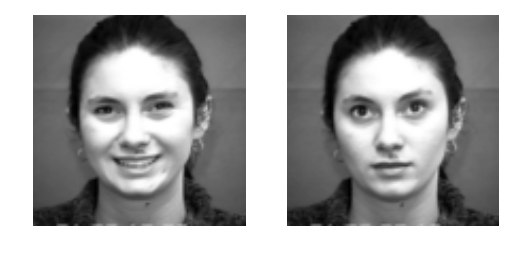

Recognizing for K =  5
Euclidean Distance :  728.241099854


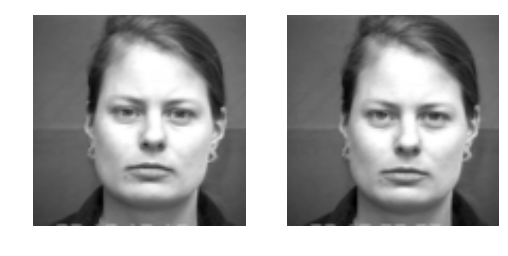

Recognizing for K =  5
Euclidean Distance :  522.825619158


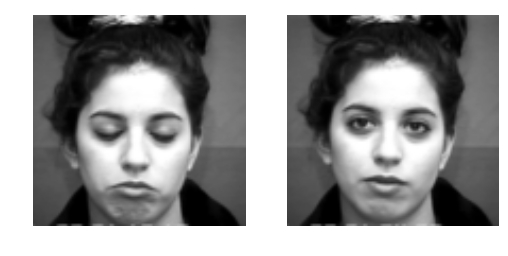

Recognizing for K =  5
Euclidean Distance :  1989.89548136


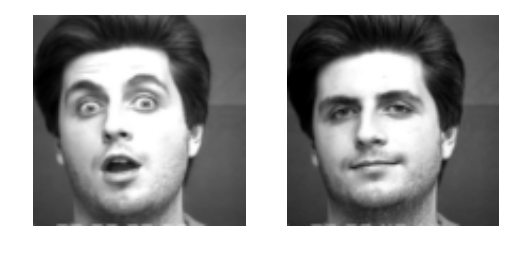

Recognizing for K =  5
Euclidean Distance :  983.565351028


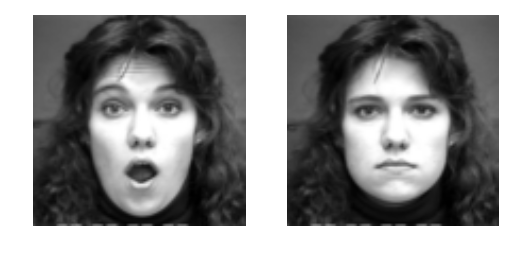

Recognizing for K =  5
Euclidean Distance :  1278.86653869


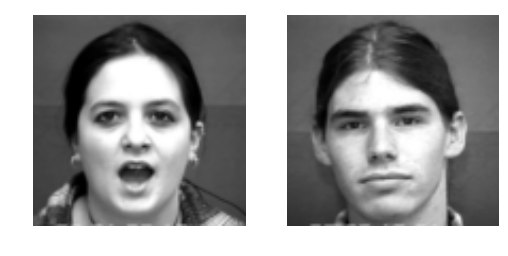

Recognizing for K =  5
Euclidean Distance :  313.69377154


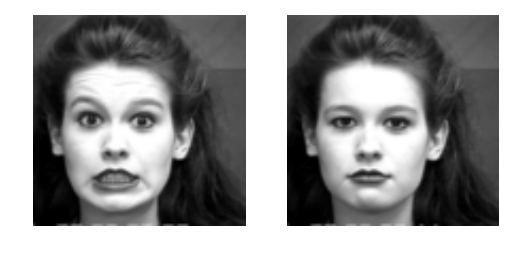

Recognizing for K =  5
Euclidean Distance :  415.46203403


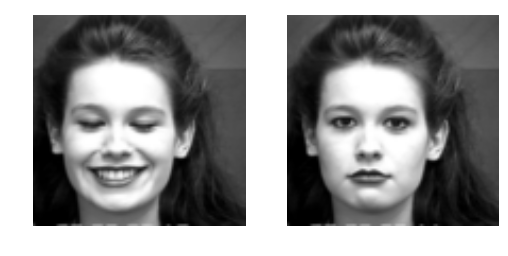

Recognizing for K =  5
Euclidean Distance :  1210.50911037


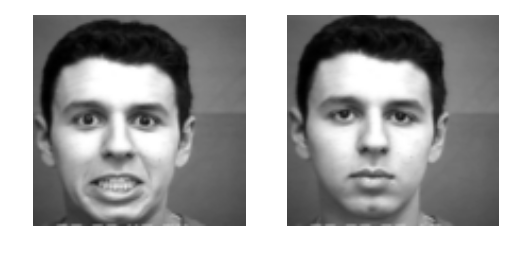

Recognizing for K =  5
Euclidean Distance :  1040.07072055


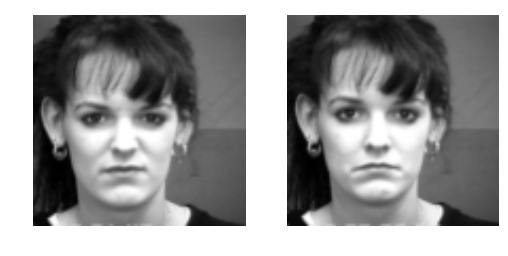

Recognizing for K =  5
Euclidean Distance :  657.462952687


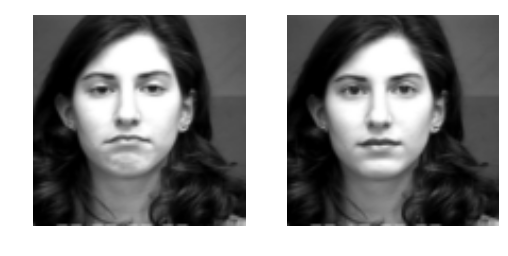

Recognizing for K =  5
Euclidean Distance :  443.455202829


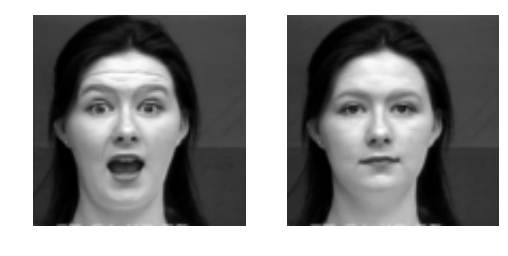

Recognizing for K =  5
Euclidean Distance :  364.266851977


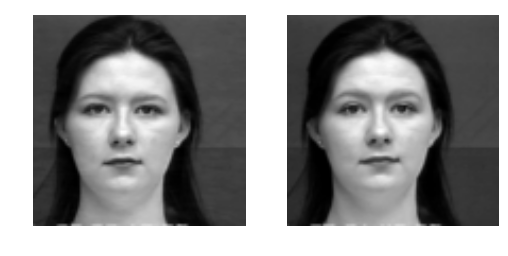

Recognizing for K =  5
Euclidean Distance :  2234.73373078


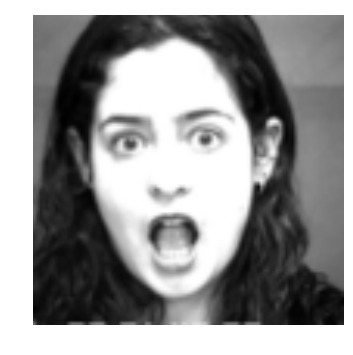

Recognizing for K =  5
Euclidean Distance :  1829.3545654


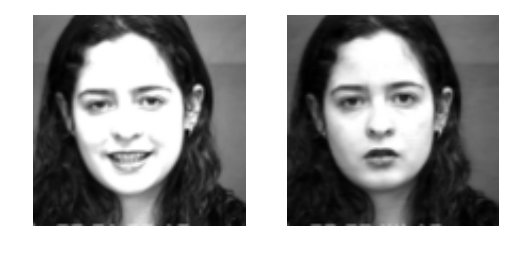

Recognizing for K =  5
Euclidean Distance :  1773.87291876


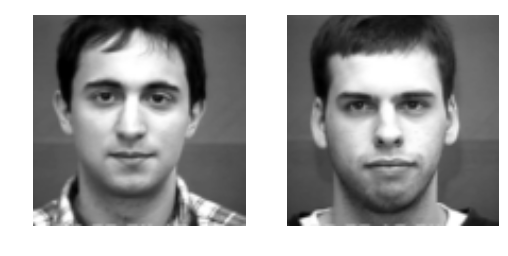

Recognizing for K =  5
Euclidean Distance :  2822.82040672


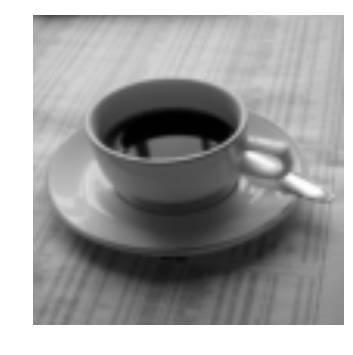

Recognizing for K =  5
Euclidean Distance :  2856.66041005


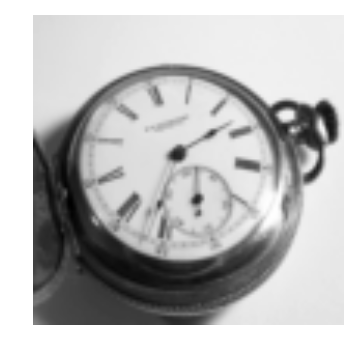

Recognizing for K =  5
Euclidean Distance :  1504.29620047


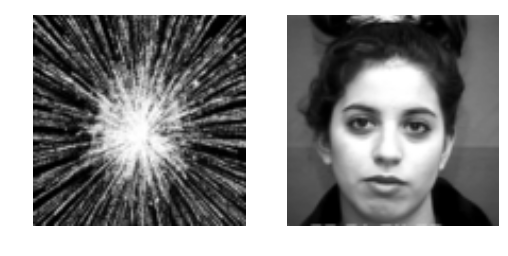

Recognizing for K =  5
Euclidean Distance :  3066.85908291


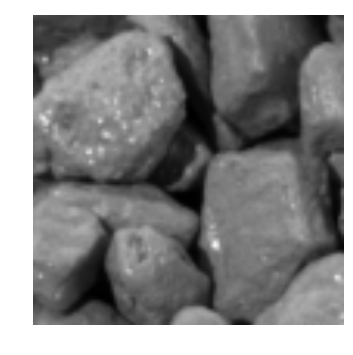

Recognizing for K =  5
Euclidean Distance :  2004.01242429


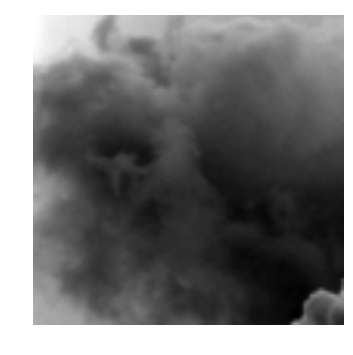

Recognizing for K =  5
Euclidean Distance :  2688.06569067


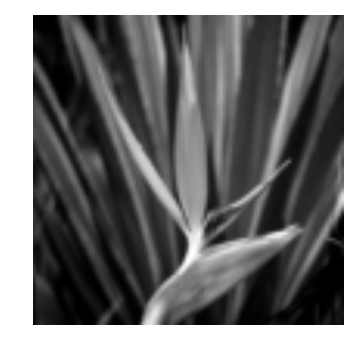

Recognizing for K =  5
Euclidean Distance :  2363.05822694


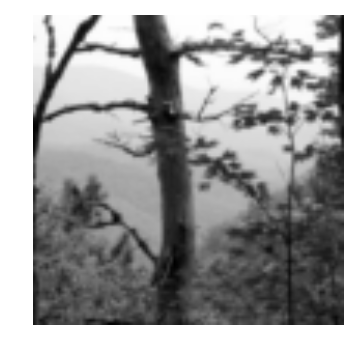

In [22]:
no_evectors = [5]
dictionary_ev = reconstruct_img(no_evectors, zero_mean_image_matrix, 
                                  eigen_vector_dict,mean_vector)
sum_test_imgs = match_images(zero_mean_matrix,
                                                               dictionary_ev,
                                                               image_100,
                                                               test_image_100,
                                                               testing_names,
                                                               training_names)
print('mathing for K=5')
display_test_images(th, sum_test_imgs,False)

mathing for K=15
Recognizing for K =  15
Euclidean Distance :  6511.30271571


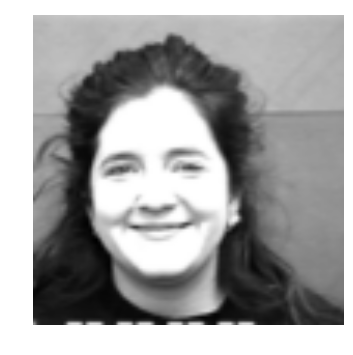

Recognizing for K =  15
Euclidean Distance :  6077.85716093


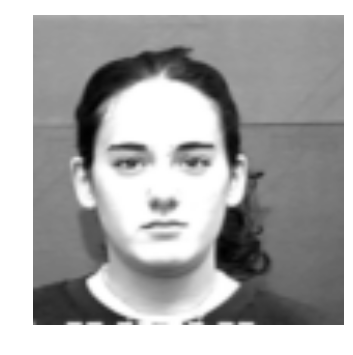

Recognizing for K =  15
Euclidean Distance :  6610.1305811


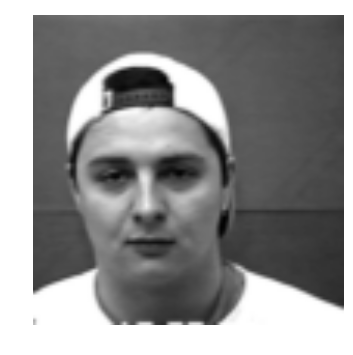

Recognizing for K =  15
Euclidean Distance :  6105.36007679


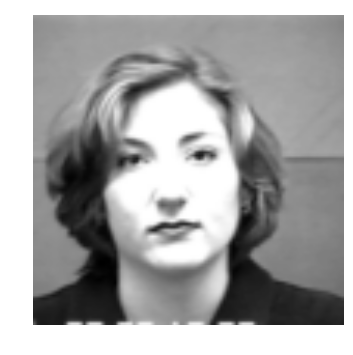

Recognizing for K =  15
Euclidean Distance :  5776.90217187


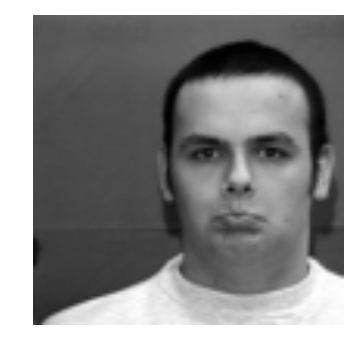

Recognizing for K =  15
Euclidean Distance :  3508.93000128


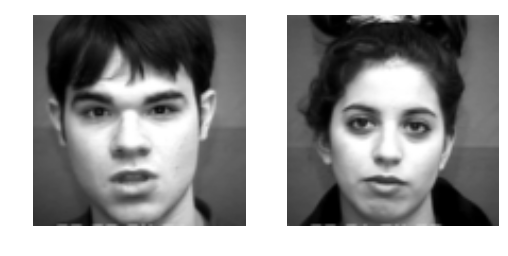

Recognizing for K =  15
Euclidean Distance :  187.925530492


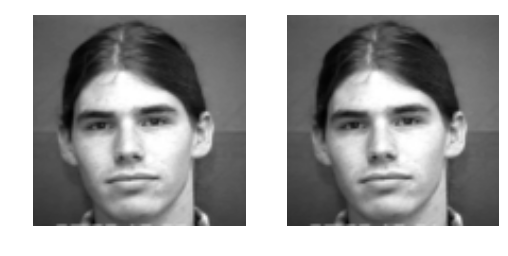

Recognizing for K =  15
Euclidean Distance :  1185.9563403


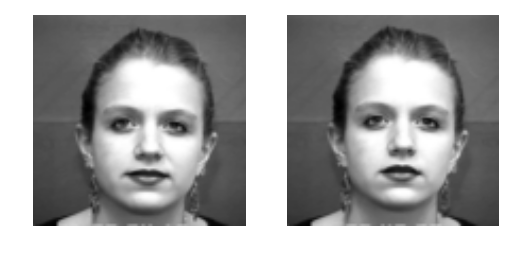

Recognizing for K =  15
Euclidean Distance :  81.303708927


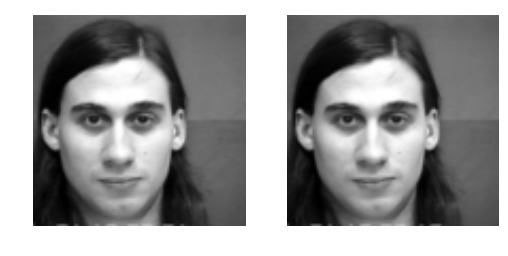

Recognizing for K =  15
Euclidean Distance :  994.356567126


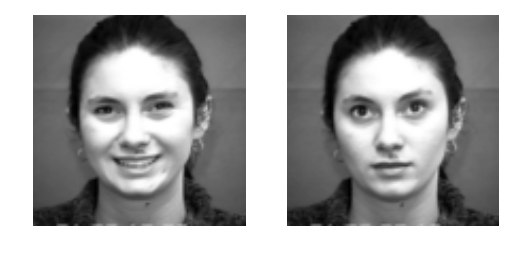

Recognizing for K =  15
Euclidean Distance :  991.735930058


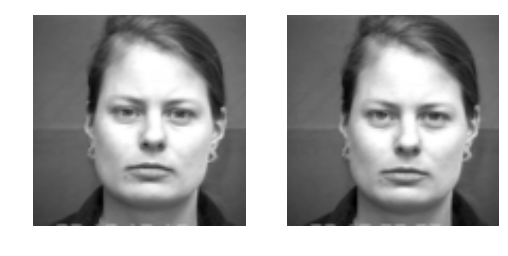

Recognizing for K =  15
Euclidean Distance :  1225.22768144


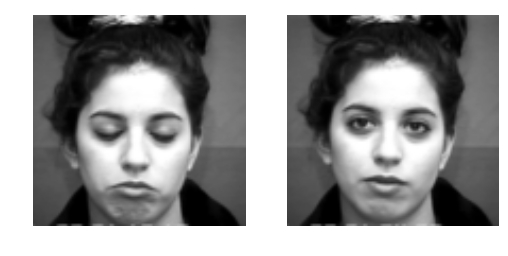

Recognizing for K =  15
Euclidean Distance :  3798.19502926


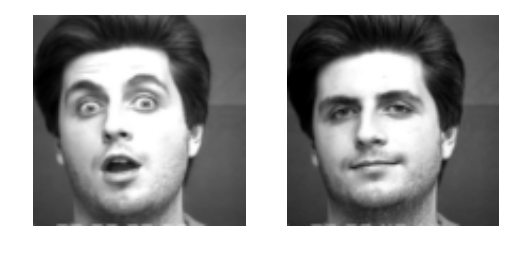

Recognizing for K =  15
Euclidean Distance :  1790.99879932


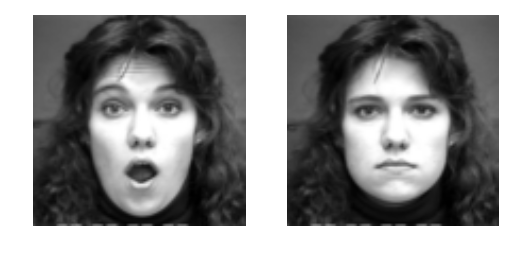

Recognizing for K =  15
Euclidean Distance :  2730.00459496


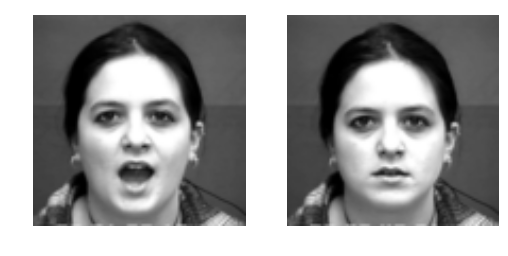

Recognizing for K =  15
Euclidean Distance :  687.085508114


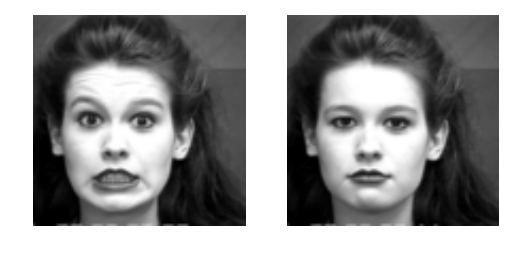

Recognizing for K =  15
Euclidean Distance :  1192.15326477


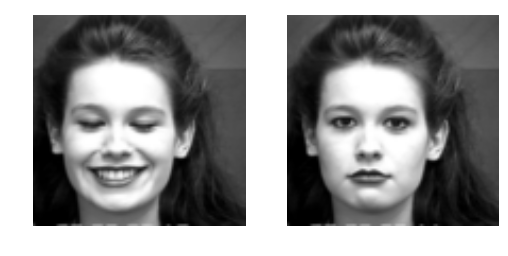

Recognizing for K =  15
Euclidean Distance :  2546.67848418


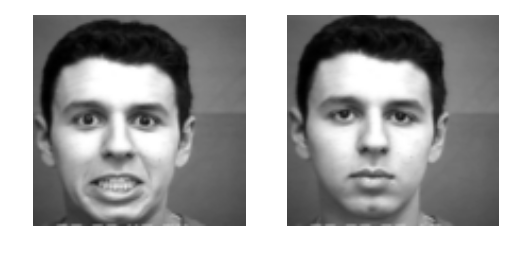

Recognizing for K =  15
Euclidean Distance :  1602.04354821


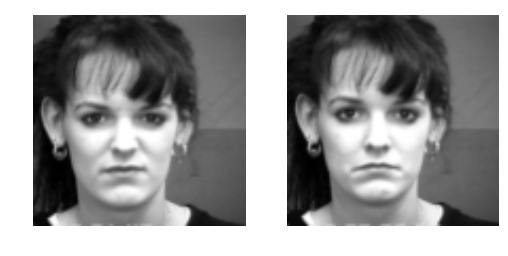

Recognizing for K =  15
Euclidean Distance :  995.402290835


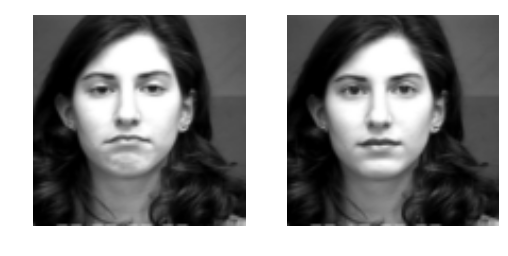

Recognizing for K =  15
Euclidean Distance :  695.292065698


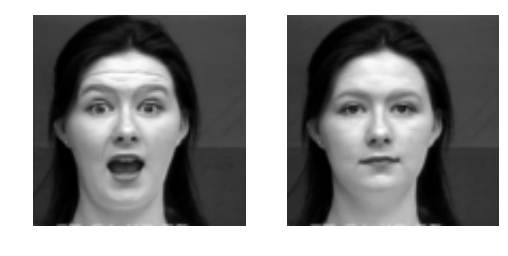

Recognizing for K =  15
Euclidean Distance :  1025.32429085


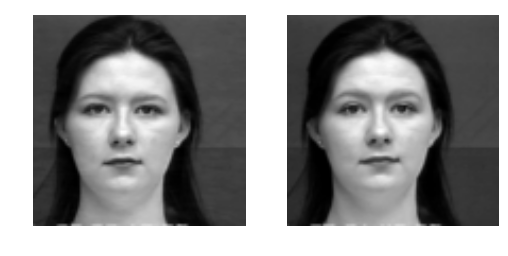

Recognizing for K =  15
Euclidean Distance :  4724.77872218


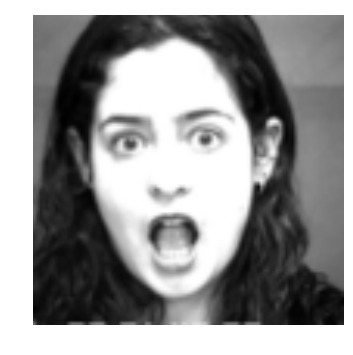

Recognizing for K =  15
Euclidean Distance :  3764.49423016


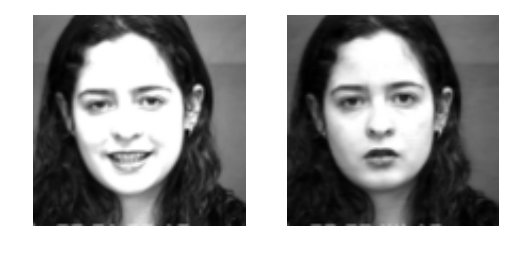

Recognizing for K =  15
Euclidean Distance :  4466.91095157


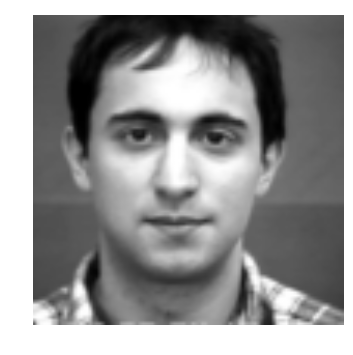

Recognizing for K =  15
Euclidean Distance :  5871.02733379


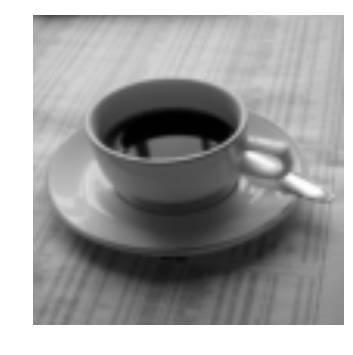

Recognizing for K =  15
Euclidean Distance :  7117.49819558


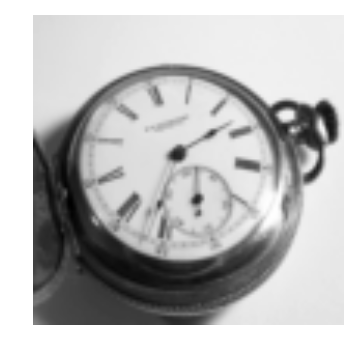

Recognizing for K =  15
Euclidean Distance :  5577.6777999


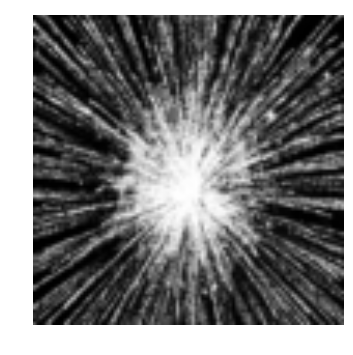

Recognizing for K =  15
Euclidean Distance :  6202.19571995


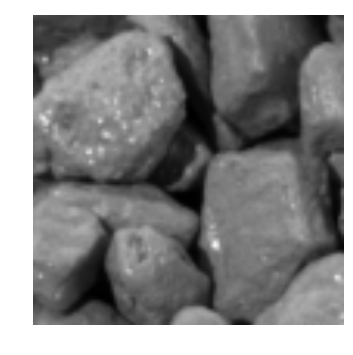

Recognizing for K =  15
Euclidean Distance :  6782.18562719


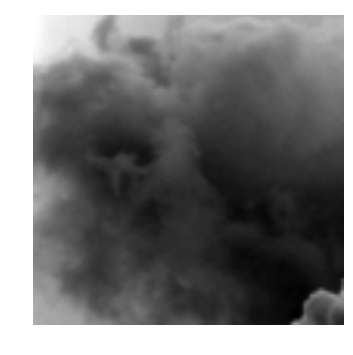

Recognizing for K =  15
Euclidean Distance :  6875.09720167


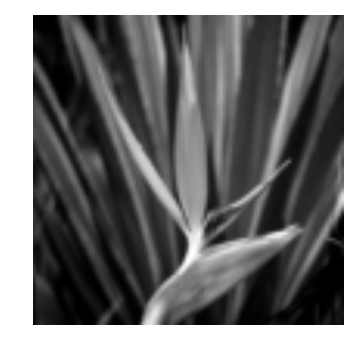

Recognizing for K =  15
Euclidean Distance :  5156.17491498


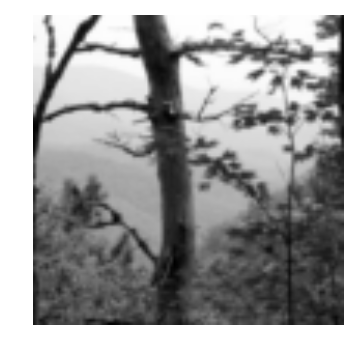

In [23]:
no_evectors = [15]
dictionary_ev = reconstruct_img(no_evectors, zero_mean_image_matrix, 
                                  eigen_vector_dict,mean_vector)
sum_test_imgs = match_images(zero_mean_matrix,
                                                               dictionary_ev,
                                                               image_100,
                                                               test_image_100,
                                                               testing_names,
                                                               training_names)
print('mathing for K=15')
display_test_images(th, sum_test_imgs,False)

# Task 4

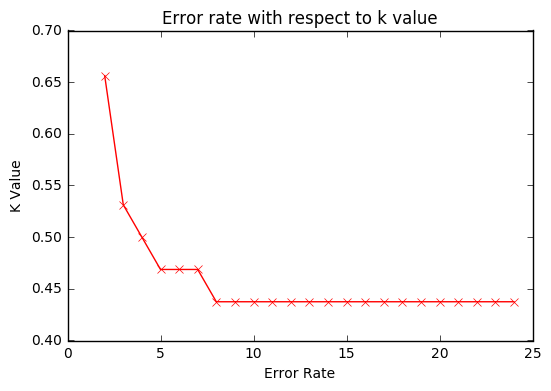

In [24]:
no_evectors = np.linspace(2, no_training_imgs-1, no_training_imgs-2, dtype=int)
dictionary_ev = reconstruct_img(no_evectors,
                                                          zero_mean_image_matrix,                           
                                                          eigen_vector_dict,
                                                          mean_vector)

sum_test_imgs = match_images(zero_mean_matrix,
                                                               dictionary_ev,
                                                               image_100,
                                                               test_image_100,
                                                               testing_names,
                                                               training_names)
error_dict,x,y = find_error_rate(sum_test_imgs)
plot_graph_of_error(x,y)
os.chdir(cwd)